In [ ]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize


from stardist.matching import matching, matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D
from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available

np.random.seed(42)
lbl_cmap = random_label_cmap()

In [2]:
import tensorflow as tf

if tf.config.list_physical_devices('GPU'):
    print('CUDA is available')
else:
    print('CUDA is not available')


CUDA is available


In [3]:
import numpy
numpy.version.version

'1.24.4'

In [4]:
import numpy as np
import xml.etree.ElementTree as ET
import cv2
import random
import matplotlib.pyplot as plt
from skimage import io, transform

def he_to_binary_mask_final(filename):
    im_file = filename + '.tif'
    xml_file = filename + '.xml'

    # Parse the XML file
    xDoc = ET.parse(xml_file)
    Regions = xDoc.findall('.//Region')  # get a list of all the region tags
    xy = []

    for region in Regions:
        vertices = region.findall('.//Vertex')
        xy_region = np.zeros((len(vertices), 2))

        for i, vertex in enumerate(vertices):
            x = float(vertex.get('X'))
            y = float(vertex.get('Y'))
            xy_region[i, :] = [x, y]

        xy.append(xy_region)

    im_info = cv2.imread(im_file)

    nrow, ncol, _ = im_info.shape
    binary_mask = np.zeros((nrow, ncol), dtype=np.uint8)
    color_mask = np.zeros((nrow, ncol, 3), dtype=np.float32)

    for zz, vertices in enumerate(xy, start=1):
        #print(f'Processing object #{zz}')
        smaller_x = vertices[:, 0].astype(int)
        smaller_y = vertices[:, 1].astype(int)

        # Create a mask and add it to the current mask
        # Use logical OR to handle overlapping objects
        polygon = cv2.fillPoly(np.zeros_like(binary_mask), [vertices.astype(int)], 1)
        binary_mask = binary_mask + zz * (1 - np.minimum(1, binary_mask)) * polygon

        # Create a random color mask
        color_mask += np.stack([random.random() * polygon for _ in range(3)], axis=2)

    
    return binary_mask, im_info




X = []
Y = []

for url in tqdm(glob('data/MoNuSegTraining Data/*.tif')):
    # # Call the function with your filename
    binary_mask, image = he_to_binary_mask_final(url.split(".")[0])

#     X.append(image)
#     Y.append(binary_mask)
        
    patch_size = 500
    stride = 500  # Adjust this value if you want overlapping patches

    height, width, _ = image.shape
    
    image = transform.resize(image, (height, width))

    # Calculate the number of patches in rows and columns
    num_rows = (height - patch_size) // stride + 1
    num_cols = (width - patch_size) // stride + 1


    for i in range(num_rows):
        for j in range(num_cols):
            # Calculate the starting and ending coordinates of the patch
            start_x = i * stride
            start_y = j * stride
            end_x = start_x + patch_size
            end_y = start_y + patch_size

            # Extract the patch from the image
            patch = image[start_x:end_x, start_y:end_y]
            mask = binary_mask[start_x:end_x, start_y:end_y]

            # Append the patch to the list
            X.append(patch)
            Y.append(mask)


X_test=[]
Y_test=[]
for url in tqdm(glob('data/MoNuSegTestData/*.tif')):
    # # Call the function with your filename
    binary_mask, image = he_to_binary_mask_final(url.split(".")[0])
    height, width, _ = image.shape
    image = transform.resize(image, (height, width))
    X_test.append(image)
    Y_test.append(binary_mask)

100%|██████████| 14/14 [02:48<00:00, 12.07s/it]


In [5]:
#X = [255 - img[:, :, 1] for img in X]
#X_test = [255 - img[:, :, 1] for img in X_test]

n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

In [6]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.10 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images: 148
- training:       133
- validation:      15


In [7]:
print(np.array(X_trn).shape)
print(np.array(Y_trn).shape)

(133, 500, 500, 3)
(133, 500, 500)


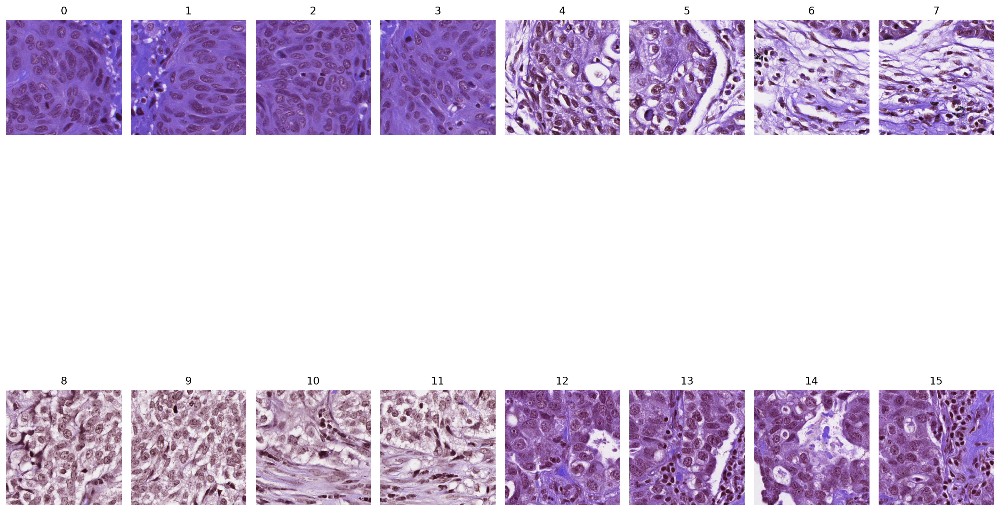

In [8]:
# show all test images
if True:
    fig, ax = plt.subplots(2,8, figsize=(16,16))
    for i,(a,x) in enumerate(zip(ax.flat, X)):
        a.imshow(x)
        a.set_title(i)
    [a.axis('off') for a in ax.flat]
    plt.tight_layout()
None;

In [9]:
def plot_img_label(img, lbl, img_title="image", lbl_title="label", **kwargs):
    fig, (ai,al) = plt.subplots(1,2, figsize=(12,5), gridspec_kw=dict(width_ratios=(1.25,1)))
    im = ai.imshow(img, cmap='gray', clim=(0,1))
    ai.set_title(img_title)    
    fig.colorbar(im, ax=ai)
    al.imshow(lbl, cmap=lbl_cmap)
    al.set_title(lbl_title)
    plt.tight_layout()

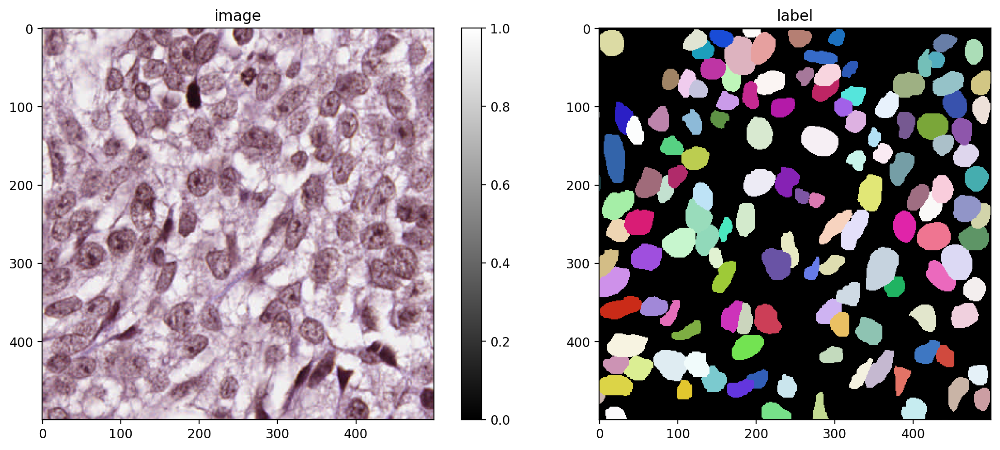

In [10]:
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plot_img_label(img,lbl)
None;

In [11]:
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [12]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# conf = Config2D (
#     n_rays       = n_rays,
#     grid         = grid,
#     use_gpu      = use_gpu,
#     n_channel_in = n_channel,
#     net_input_shape=(512, 512, 3),
#     train_epochs = 200,
#     n_classes=4,
#     train_patch_size= (512, 512),
# )


conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel
)

print(conf)
vars(conf)

Config2D(n_dim=2, axes='YXC', n_channel_in=3, n_channel_out=33, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=32, grid=(2, 2), backbone='unet', n_classes=None, unet_n_depth=3, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, net_input_shape=(None, None, 3), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(256, 256), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_loss_weights=(1, 0.2), train_class_weights=(1, 1), train_epochs=400, train_steps_per_epoch=100, train_learning_rate=0.0003, train_batch_size=4, train_n_val_patches=None, train_tensorboard=True, train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 3,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 3),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,


In [13]:
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    limit_gpu_memory(0.8)
    # alternatively, try this:
    # limit_gpu_memory(None, allow_growth=True)

In [14]:
model = StarDist2D(conf, name='densenet_segnet_iit', basedir='models')

Model: "densenet169"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   896         ['input[0][0]']                  
                                32)                                                               
                                                                                                  
 conv2d_1 (Conv2D)              (None, None, None,   9248        ['conv2d[0][0]']                 
                                32)                                                     

                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, None, None,   512        ['conv2_block3_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv2_block3_1_relu (Activatio  (None, None, None,   0          ['conv2_block3_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, None, None,   36864       ['conv2_block3_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv2_blo

                                128)                                                              
                                                                                                  
 pool2_pool (AveragePooling2D)  (None, None, None,   0           ['pool2_conv[0][0]']             
                                128)                                                              
                                                                                                  
 conv3_block1_0_bn (BatchNormal  (None, None, None,   512        ['pool2_pool[0][0]']             
 ization)                       128)                                                              
                                                                                                  
 conv3_block1_0_relu (Activatio  (None, None, None,   0          ['conv3_block1_0_bn[0][0]']      
 n)                             128)                                                              
          

 conv3_block4_2_conv (Conv2D)   (None, None, None,   36864       ['conv3_block4_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv3_block4_concat (Concatena  (None, None, None,   0          ['conv3_block3_concat[0][0]',    
 te)                            256)                              'conv3_block4_2_conv[0][0]']    
                                                                                                  
 conv3_block5_0_bn (BatchNormal  (None, None, None,   1024       ['conv3_block4_concat[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv3_block5_0_relu (Activatio  (None, None, None,   0          ['conv3_block5_0_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block8_2_conv (Conv2D)   (None, None, None,   36864       ['conv3_block8_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv3_block8_concat (Concatena  (None, None, None,   0          ['conv3_block7_concat[0][0]',    
 te)                            384)                              'conv3_block8_2_conv[0][0]']    
                                                                                                  
 conv3_block9_0_bn (BatchNormal  (None, None, None,   1536       ['conv3_block8_concat[0][0]']    
 ization)                       384)                                                              
                                                                                                  
 conv3_blo

 on)                            128)                                                              
                                                                                                  
 conv3_block12_2_conv (Conv2D)  (None, None, None,   36864       ['conv3_block12_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv3_block12_concat (Concaten  (None, None, None,   0          ['conv3_block11_concat[0][0]',   
 ate)                           512)                              'conv3_block12_2_conv[0][0]']   
                                                                                                  
 pool3_bn (BatchNormalization)  (None, None, None,   2048        ['conv3_block12_concat[0][0]']   
                                512)                                                              
          

 conv4_block4_0_bn (BatchNormal  (None, None, None,   1408       ['conv4_block3_concat[0][0]']    
 ization)                       352)                                                              
                                                                                                  
 conv4_block4_0_relu (Activatio  (None, None, None,   0          ['conv4_block4_0_bn[0][0]']      
 n)                             352)                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2D)   (None, None, None,   45056       ['conv4_block4_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv4_block4_1_bn (BatchNormal  (None, None, None,   512        ['conv4_block4_1_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block8_0_bn (BatchNormal  (None, None, None,   1920       ['conv4_block7_concat[0][0]']    
 ization)                       480)                                                              
                                                                                                  
 conv4_block8_0_relu (Activatio  (None, None, None,   0          ['conv4_block8_0_bn[0][0]']      
 n)                             480)                                                              
                                                                                                  
 conv4_block8_1_conv (Conv2D)   (None, None, None,   61440       ['conv4_block8_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv4_blo

 ate)                           608)                              'conv4_block11_2_conv[0][0]']   
                                                                                                  
 conv4_block12_0_bn (BatchNorma  (None, None, None,   2432       ['conv4_block11_concat[0][0]']   
 lization)                      608)                                                              
                                                                                                  
 conv4_block12_0_relu (Activati  (None, None, None,   0          ['conv4_block12_0_bn[0][0]']     
 on)                            608)                                                              
                                                                                                  
 conv4_block12_1_conv (Conv2D)  (None, None, None,   77824       ['conv4_block12_0_relu[0][0]']   
                                128)                                                              
          

 conv4_block15_concat (Concaten  (None, None, None,   0          ['conv4_block14_concat[0][0]',   
 ate)                           736)                              'conv4_block15_2_conv[0][0]']   
                                                                                                  
 conv4_block16_0_bn (BatchNorma  (None, None, None,   2944       ['conv4_block15_concat[0][0]']   
 lization)                      736)                                                              
                                                                                                  
 conv4_block16_0_relu (Activati  (None, None, None,   0          ['conv4_block16_0_bn[0][0]']     
 on)                            736)                                                              
                                                                                                  
 conv4_block16_1_conv (Conv2D)  (None, None, None,   94208       ['conv4_block16_0_relu[0][0]']   
          

                                                                                                  
 conv4_block19_concat (Concaten  (None, None, None,   0          ['conv4_block18_concat[0][0]',   
 ate)                           864)                              'conv4_block19_2_conv[0][0]']   
                                                                                                  
 conv4_block20_0_bn (BatchNorma  (None, None, None,   3456       ['conv4_block19_concat[0][0]']   
 lization)                      864)                                                              
                                                                                                  
 conv4_block20_0_relu (Activati  (None, None, None,   0          ['conv4_block20_0_bn[0][0]']     
 on)                            864)                                                              
                                                                                                  
 conv4_blo

                                32)                                                               
                                                                                                  
 conv4_block23_concat (Concaten  (None, None, None,   0          ['conv4_block22_concat[0][0]',   
 ate)                           992)                              'conv4_block23_2_conv[0][0]']   
                                                                                                  
 conv4_block24_0_bn (BatchNorma  (None, None, None,   3968       ['conv4_block23_concat[0][0]']   
 lization)                      992)                                                              
                                                                                                  
 conv4_block24_0_relu (Activati  (None, None, None,   0          ['conv4_block24_0_bn[0][0]']     
 on)                            992)                                                              
          

 conv4_block27_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block27_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv4_block27_concat (Concaten  (None, None, None,   0          ['conv4_block26_concat[0][0]',   
 ate)                           1120)                             'conv4_block27_2_conv[0][0]']   
                                                                                                  
 conv4_block28_0_bn (BatchNorma  (None, None, None,   4480       ['conv4_block27_concat[0][0]']   
 lization)                      1120)                                                             
                                                                                                  
 conv4_block28_0_relu (Activati  (None, None, None,   0          ['conv4_block28_0_bn[0][0]']     
 on)      

                                                                                                  
 conv4_block31_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block31_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv4_block31_concat (Concaten  (None, None, None,   0          ['conv4_block30_concat[0][0]',   
 ate)                           1248)                             'conv4_block31_2_conv[0][0]']   
                                                                                                  
 conv4_block32_0_bn (BatchNorma  (None, None, None,   4992       ['conv4_block31_concat[0][0]']   
 lization)                      1248)                                                             
                                                                                                  
 conv4_blo

 ization)                       704)                                                              
                                                                                                  
 conv5_block3_0_relu (Activatio  (None, None, None,   0          ['conv5_block3_0_bn[0][0]']      
 n)                             704)                                                              
                                                                                                  
 conv5_block3_1_conv (Conv2D)   (None, None, None,   90112       ['conv5_block3_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv5_block3_1_bn (BatchNormal  (None, None, None,   512        ['conv5_block3_1_conv[0][0]']    
 ization)                       128)                                                              
          

 conv5_block7_0_bn (BatchNormal  (None, None, None,   3328       ['conv5_block6_concat[0][0]']    
 ization)                       832)                                                              
                                                                                                  
 conv5_block7_0_relu (Activatio  (None, None, None,   0          ['conv5_block7_0_bn[0][0]']      
 n)                             832)                                                              
                                                                                                  
 conv5_block7_1_conv (Conv2D)   (None, None, None,   106496      ['conv5_block7_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv5_block7_1_bn (BatchNormal  (None, None, None,   512        ['conv5_block7_1_conv[0][0]']    
 ization) 

                                                                                                  
 conv5_block11_0_bn (BatchNorma  (None, None, None,   3840       ['conv5_block10_concat[0][0]']   
 lization)                      960)                                                              
                                                                                                  
 conv5_block11_0_relu (Activati  (None, None, None,   0          ['conv5_block11_0_bn[0][0]']     
 on)                            960)                                                              
                                                                                                  
 conv5_block11_1_conv (Conv2D)  (None, None, None,   122880      ['conv5_block11_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_blo

 ate)                           1088)                             'conv5_block14_2_conv[0][0]']   
                                                                                                  
 conv5_block15_0_bn (BatchNorma  (None, None, None,   4352       ['conv5_block14_concat[0][0]']   
 lization)                      1088)                                                             
                                                                                                  
 conv5_block15_0_relu (Activati  (None, None, None,   0          ['conv5_block15_0_bn[0][0]']     
 on)                            1088)                                                             
                                                                                                  
 conv5_block15_1_conv (Conv2D)  (None, None, None,   139264      ['conv5_block15_0_relu[0][0]']   
                                128)                                                              
          

 conv5_block18_concat (Concaten  (None, None, None,   0          ['conv5_block17_concat[0][0]',   
 ate)                           1216)                             'conv5_block18_2_conv[0][0]']   
                                                                                                  
 conv5_block19_0_bn (BatchNorma  (None, None, None,   4864       ['conv5_block18_concat[0][0]']   
 lization)                      1216)                                                             
                                                                                                  
 conv5_block19_0_relu (Activati  (None, None, None,   0          ['conv5_block19_0_bn[0][0]']     
 on)                            1216)                                                             
                                                                                                  
 conv5_block19_1_conv (Conv2D)  (None, None, None,   155648      ['conv5_block19_0_relu[0][0]']   
          

                                                                                                  
 conv5_block22_concat (Concaten  (None, None, None,   0          ['conv5_block21_concat[0][0]',   
 ate)                           1344)                             'conv5_block22_2_conv[0][0]']   
                                                                                                  
 conv5_block23_0_bn (BatchNorma  (None, None, None,   5376       ['conv5_block22_concat[0][0]']   
 lization)                      1344)                                                             
                                                                                                  
 conv5_block23_0_relu (Activati  (None, None, None,   0          ['conv5_block23_0_bn[0][0]']     
 on)                            1344)                                                             
                                                                                                  
 conv5_blo

                                32)                                                               
                                                                                                  
 conv5_block26_concat (Concaten  (None, None, None,   0          ['conv5_block25_concat[0][0]',   
 ate)                           1472)                             'conv5_block26_2_conv[0][0]']   
                                                                                                  
 conv5_block27_0_bn (BatchNorma  (None, None, None,   5888       ['conv5_block26_concat[0][0]']   
 lization)                      1472)                                                             
                                                                                                  
 conv5_block27_0_relu (Activati  (None, None, None,   0          ['conv5_block27_0_bn[0][0]']     
 on)                            1472)                                                             
          

 conv5_block30_2_conv (Conv2D)  (None, None, None,   36864       ['conv5_block30_1_relu[0][0]']   
                                32)                                                               
                                                                                                  
 conv5_block30_concat (Concaten  (None, None, None,   0          ['conv5_block29_concat[0][0]',   
 ate)                           1600)                             'conv5_block30_2_conv[0][0]']   
                                                                                                  
 conv5_block31_0_bn (BatchNorma  (None, None, None,   6400       ['conv5_block30_concat[0][0]']   
 lization)                      1600)                                                             
                                                                                                  
 conv5_block31_0_relu (Activati  (None, None, None,   0          ['conv5_block31_0_bn[0][0]']     
 on)      

                                                                                                  
 zero_padding2d_1 (ZeroPadding2  (None, None, None,   0          ['conv1/relu[0][0]']             
 D)                             64)                                                               
                                                                                                  
 pool1 (MaxPooling2D)           (None, None, None,   0           ['zero_padding2d_1[0][0]']       
                                64)                                                               
                                                                                                  
 conv2_block1_0_bn (BatchNormal  (None, None, None,   256        ['pool1[0][0]']                  
 ization)                       64)                                                               
                                                                                                  
 conv2_blo

 n)                             128)                                                              
                                                                                                  
 conv2_block4_2_conv (Conv2D)   (None, None, None,   36864       ['conv2_block4_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv2_block4_concat (Concatena  (None, None, None,   0          ['conv2_block3_concat[0][0]',    
 te)                            192)                              'conv2_block4_2_conv[0][0]']    
                                                                                                  
 conv2_block5_0_bn (BatchNormal  (None, None, None,   768        ['conv2_block4_concat[0][0]']    
 ization)                       192)                                                              
          

 conv3_block2_0_bn (BatchNormal  (None, None, None,   640        ['conv3_block1_concat[0][0]']    
 ization)                       160)                                                              
                                                                                                  
 conv3_block2_0_relu (Activatio  (None, None, None,   0          ['conv3_block2_0_bn[0][0]']      
 n)                             160)                                                              
                                                                                                  
 conv3_block2_1_conv (Conv2D)   (None, None, None,   20480       ['conv3_block2_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_1_conv[0][0]']    
 ization) 

                                                                                                  
 conv3_block6_0_bn (BatchNormal  (None, None, None,   1152       ['conv3_block5_concat[0][0]']    
 ization)                       288)                                                              
                                                                                                  
 conv3_block6_0_relu (Activatio  (None, None, None,   0          ['conv3_block6_0_bn[0][0]']      
 n)                             288)                                                              
                                                                                                  
 conv3_block6_1_conv (Conv2D)   (None, None, None,   36864       ['conv3_block6_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_blo

 te)                            416)                              'conv3_block9_2_conv[0][0]']    
                                                                                                  
 conv3_block10_0_bn (BatchNorma  (None, None, None,   1664       ['conv3_block9_concat[0][0]']    
 lization)                      416)                                                              
                                                                                                  
 conv3_block10_0_relu (Activati  (None, None, None,   0          ['conv3_block10_0_bn[0][0]']     
 on)                            416)                                                              
                                                                                                  
 conv3_block10_1_conv (Conv2D)  (None, None, None,   53248       ['conv3_block10_0_relu[0][0]']   
                                128)                                                              
          

 up_sampling2d (UpSampling2D)   (None, None, None,   0           ['batch_normalization[0][0]']    
                                512)                                                              
                                                                                                  
 conv2d_3 (Conv2D)              (None, None, None,   1179904     ['up_sampling2d[0][0]']          
                                256)                                                              
                                                                                                  
 batch_normalization_1 (BatchNo  (None, None, None,   1024       ['conv2d_3[0][0]']               
 rmalization)                   256)                                                              
                                                                                                  
 up_sampling2d_1 (UpSampling2D)  (None, None, None,   0          ['batch_normalization_1[0][0]']  
          

In [15]:
def random_fliprot(img, mask): 
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim))) 
    mask = mask.transpose(perm) 
    for ax in axes: 
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask 

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,1) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


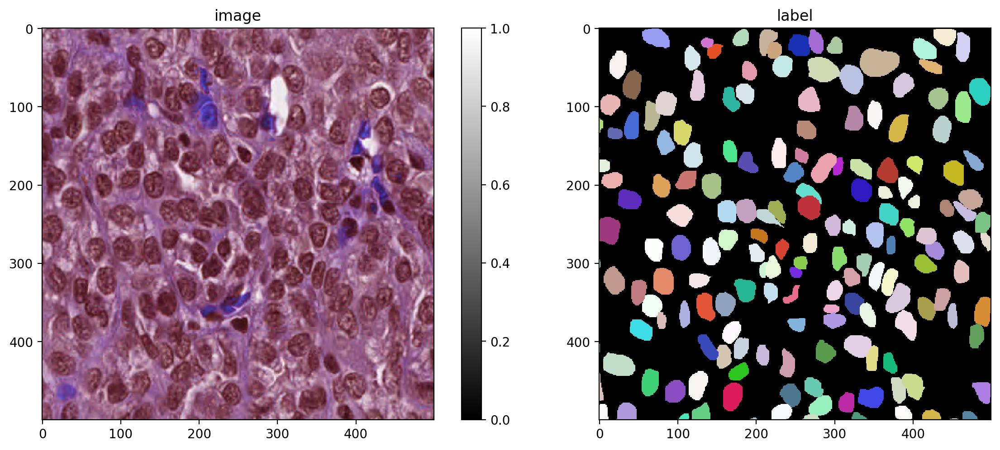

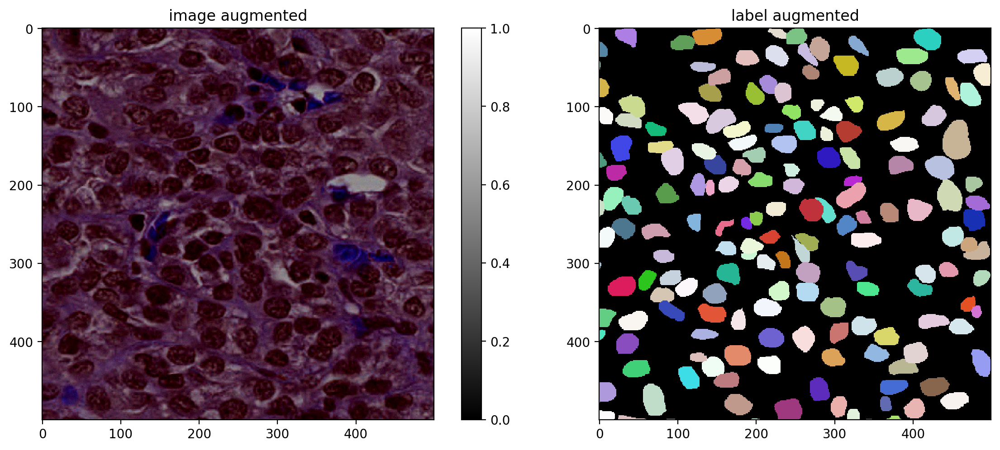

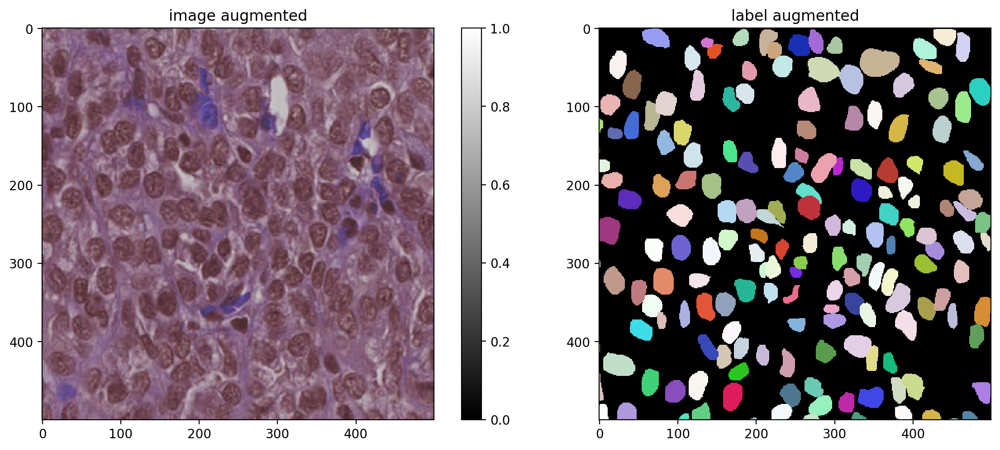

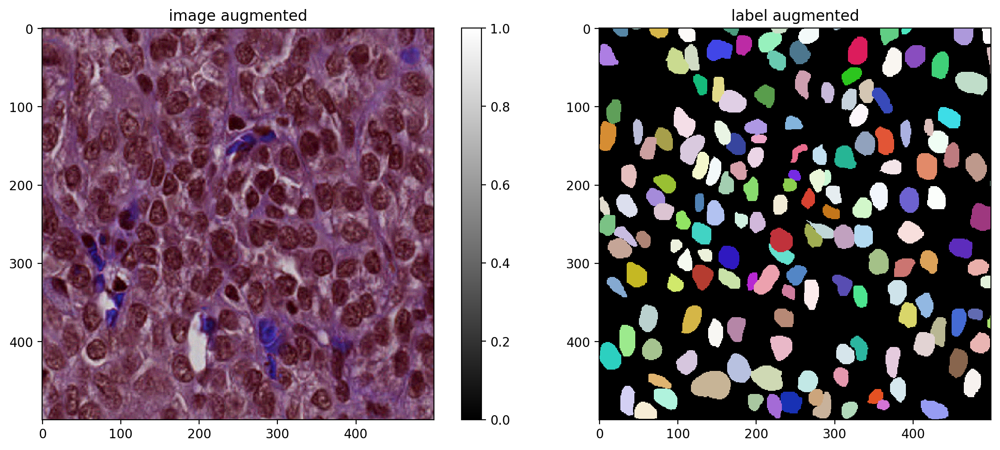

In [16]:
# plot some augmented examples
img, lbl = X_trn[0],Y_trn[0]
plot_img_label(img, lbl)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)
    plot_img_label(img_aug, lbl_aug, img_title="image augmented", lbl_title="label augmented")

In [17]:
model.train(X_trn,Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
            epochs=200) # 200 epochs seem to be enough for synthetic demo dataset

Epoch 1/200
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

100/100 [==============================] - 19s 190ms/step - loss: 1.5383 - prob_loss: 0.3477 - dist_loss: 5.9530 - prob_kld: 0.1919 - dist_relevant_mae: 5.9523 - dist_relevant_mse: 68.0272 - dist_dist_iou_metric: 0.3263 - val_loss: 2.0245 - val_prob_loss: 0.5588 - val_dist_loss: 7.3282 - val_prob_kld: 0.3353 - val_dist_relevant_mae: 7.3271 - val_dist_relevant_mse: 80.4428 - val_dist_dist_iou_metric: 0.3526 - lr: 3.0000e-04
Epoch 3/200
100/100 [==============================] - 18s 182ms/step - loss: 1.4645 - prob_loss: 0.3275 - dist_loss: 5.6852 - prob_kld: 0.1727 - dist_relevant_mae: 5.6845 - dist_relevant_mse: 62.0912 - dist_dist_iou_metric: 0.3553 - val_loss: 2.8498 - val_prob_loss: 0.3795 - val_dist_loss: 12.3516 - val_prob_kld: 0.2432 - val_dist_relevant_mae: 12.3496 - val_dist_relevant_mse: 194.3998 - val_dist_dist_iou_metric: 0.2748 - lr: 3.0000e-04
Epoch 4/200
100/100 [==============================] - 18s 180ms/step - loss: 1.3944 - prob_loss: 0.3153 - dist_loss: 5.3955 - prob

Epoch 15/200
100/100 [==============================] - 18s 181ms/step - loss: 1.0566 - prob_loss: 0.2699 - dist_loss: 3.9335 - prob_kld: 0.1113 - dist_relevant_mae: 3.9328 - dist_relevant_mse: 33.5444 - dist_dist_iou_metric: 0.5125 - val_loss: 1.1688 - val_prob_loss: 0.2704 - val_dist_loss: 4.4920 - val_prob_kld: 0.1342 - val_dist_relevant_mae: 4.4914 - val_dist_relevant_mse: 42.1565 - val_dist_dist_iou_metric: 0.4335 - lr: 3.0000e-04
Epoch 16/200
100/100 [==============================] - 18s 178ms/step - loss: 1.0200 - prob_loss: 0.2587 - dist_loss: 3.8068 - prob_kld: 0.1061 - dist_relevant_mae: 3.8061 - dist_relevant_mse: 31.2128 - dist_dist_iou_metric: 0.5213 - val_loss: 1.0427 - val_prob_loss: 0.2384 - val_dist_loss: 4.0216 - val_prob_kld: 0.1022 - val_dist_relevant_mae: 4.0207 - val_dist_relevant_mse: 33.9242 - val_dist_dist_iou_metric: 0.5276 - lr: 3.0000e-04
Epoch 17/200
100/100 [==============================] - 18s 179ms/step - loss: 1.0392 - prob_loss: 0.2682 - dist_loss: 3

Epoch 28/200
100/100 [==============================] - 18s 185ms/step - loss: 0.9361 - prob_loss: 0.2528 - dist_loss: 3.4167 - prob_kld: 0.0965 - dist_relevant_mae: 3.4160 - dist_relevant_mse: 26.1914 - dist_dist_iou_metric: 0.5687 - val_loss: 0.9307 - val_prob_loss: 0.2283 - val_dist_loss: 3.5120 - val_prob_kld: 0.0921 - val_dist_relevant_mae: 3.5112 - val_dist_relevant_mse: 27.1744 - val_dist_dist_iou_metric: 0.5691 - lr: 3.0000e-04
Epoch 29/200
100/100 [==============================] - 18s 179ms/step - loss: 0.9084 - prob_loss: 0.2442 - dist_loss: 3.3210 - prob_kld: 0.0923 - dist_relevant_mae: 3.3203 - dist_relevant_mse: 25.0088 - dist_dist_iou_metric: 0.5780 - val_loss: 0.9298 - val_prob_loss: 0.2266 - val_dist_loss: 3.5157 - val_prob_kld: 0.0903 - val_dist_relevant_mae: 3.5150 - val_dist_relevant_mse: 27.5668 - val_dist_dist_iou_metric: 0.5687 - lr: 3.0000e-04
Epoch 30/200
100/100 [==============================] - 18s 178ms/step - loss: 0.9120 - prob_loss: 0.2508 - dist_loss: 3

Epoch 41/200
100/100 [==============================] - 18s 178ms/step - loss: 0.8625 - prob_loss: 0.2425 - dist_loss: 3.0998 - prob_kld: 0.0866 - dist_relevant_mae: 3.0990 - dist_relevant_mse: 22.2646 - dist_dist_iou_metric: 0.5993 - val_loss: 0.8990 - val_prob_loss: 0.2254 - val_dist_loss: 3.3682 - val_prob_kld: 0.0891 - val_dist_relevant_mae: 3.3674 - val_dist_relevant_mse: 25.9318 - val_dist_dist_iou_metric: 0.5690 - lr: 3.0000e-04
Epoch 42/200
100/100 [==============================] - 18s 185ms/step - loss: 0.8721 - prob_loss: 0.2434 - dist_loss: 3.1434 - prob_kld: 0.0876 - dist_relevant_mae: 3.1426 - dist_relevant_mse: 23.2724 - dist_dist_iou_metric: 0.5998 - val_loss: 0.8521 - val_prob_loss: 0.2140 - val_dist_loss: 3.1905 - val_prob_kld: 0.0777 - val_dist_relevant_mae: 3.1897 - val_dist_relevant_mse: 23.9890 - val_dist_dist_iou_metric: 0.5949 - lr: 3.0000e-04
Epoch 43/200
100/100 [==============================] - 18s 185ms/step - loss: 0.8766 - prob_loss: 0.2460 - dist_loss: 3

Epoch 54/200
100/100 [==============================] - 18s 180ms/step - loss: 0.8290 - prob_loss: 0.2375 - dist_loss: 2.9574 - prob_kld: 0.0823 - dist_relevant_mae: 2.9567 - dist_relevant_mse: 20.5056 - dist_dist_iou_metric: 0.6175 - val_loss: 0.8478 - val_prob_loss: 0.2199 - val_dist_loss: 3.1396 - val_prob_kld: 0.0836 - val_dist_relevant_mae: 3.1389 - val_dist_relevant_mse: 23.3189 - val_dist_dist_iou_metric: 0.6017 - lr: 3.0000e-04
Epoch 55/200
100/100 [==============================] - 18s 179ms/step - loss: 0.8383 - prob_loss: 0.2432 - dist_loss: 2.9752 - prob_kld: 0.0847 - dist_relevant_mae: 2.9745 - dist_relevant_mse: 21.1707 - dist_dist_iou_metric: 0.6151 - val_loss: 0.8524 - val_prob_loss: 0.2165 - val_dist_loss: 3.1792 - val_prob_kld: 0.0792 - val_dist_relevant_mae: 3.1784 - val_dist_relevant_mse: 23.9212 - val_dist_dist_iou_metric: 0.6007 - lr: 3.0000e-04
Epoch 56/200
100/100 [==============================] - 18s 181ms/step - loss: 0.8344 - prob_loss: 0.2380 - dist_loss: 2

Epoch 67/200
100/100 [==============================] - 18s 179ms/step - loss: 0.8036 - prob_loss: 0.2339 - dist_loss: 2.8483 - prob_kld: 0.0789 - dist_relevant_mae: 2.8476 - dist_relevant_mse: 19.4311 - dist_dist_iou_metric: 0.6280 - val_loss: 0.8089 - val_prob_loss: 0.2116 - val_dist_loss: 2.9868 - val_prob_kld: 0.0753 - val_dist_relevant_mae: 2.9861 - val_dist_relevant_mse: 21.1830 - val_dist_dist_iou_metric: 0.6256 - lr: 3.0000e-04
Epoch 68/200
100/100 [==============================] - 18s 181ms/step - loss: 0.8119 - prob_loss: 0.2353 - dist_loss: 2.8828 - prob_kld: 0.0787 - dist_relevant_mae: 2.8821 - dist_relevant_mse: 19.9331 - dist_dist_iou_metric: 0.6297 - val_loss: 0.8086 - val_prob_loss: 0.2105 - val_dist_loss: 2.9902 - val_prob_kld: 0.0743 - val_dist_relevant_mae: 2.9895 - val_dist_relevant_mse: 21.5433 - val_dist_dist_iou_metric: 0.6203 - lr: 3.0000e-04
Epoch 69/200
100/100 [==============================] - 18s 180ms/step - loss: 0.8193 - prob_loss: 0.2362 - dist_loss: 2

Epoch 80/200
100/100 [==============================] - 18s 180ms/step - loss: 0.8013 - prob_loss: 0.2353 - dist_loss: 2.8301 - prob_kld: 0.0788 - dist_relevant_mae: 2.8294 - dist_relevant_mse: 19.9277 - dist_dist_iou_metric: 0.6374 - val_loss: 0.8148 - val_prob_loss: 0.2168 - val_dist_loss: 2.9903 - val_prob_kld: 0.0805 - val_dist_relevant_mae: 2.9894 - val_dist_relevant_mse: 21.7147 - val_dist_dist_iou_metric: 0.6265 - lr: 3.0000e-04
Epoch 81/200
100/100 [==============================] - 18s 180ms/step - loss: 0.8008 - prob_loss: 0.2340 - dist_loss: 2.8340 - prob_kld: 0.0775 - dist_relevant_mae: 2.8333 - dist_relevant_mse: 19.4909 - dist_dist_iou_metric: 0.6345 - val_loss: 0.8160 - val_prob_loss: 0.2152 - val_dist_loss: 3.0042 - val_prob_kld: 0.0789 - val_dist_relevant_mae: 3.0035 - val_dist_relevant_mse: 21.8848 - val_dist_dist_iou_metric: 0.6136 - lr: 3.0000e-04
Epoch 82/200
100/100 [==============================] - 19s 186ms/step - loss: 0.7940 - prob_loss: 0.2351 - dist_loss: 2

Epoch 93/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7768 - prob_loss: 0.2305 - dist_loss: 2.7318 - prob_kld: 0.0742 - dist_relevant_mae: 2.7311 - dist_relevant_mse: 18.1374 - dist_dist_iou_metric: 0.6478 - val_loss: 3.6265 - val_prob_loss: 1.7561 - val_dist_loss: 9.3522 - val_prob_kld: 0.9236 - val_dist_relevant_mae: 9.3509 - val_dist_relevant_mse: 196.1646 - val_dist_dist_iou_metric: 0.2944 - lr: 3.0000e-04
Epoch 94/200
100/100 [==============================] - 18s 178ms/step - loss: 0.8336 - prob_loss: 0.2420 - dist_loss: 2.9583 - prob_kld: 0.0860 - dist_relevant_mae: 2.9576 - dist_relevant_mse: 21.4027 - dist_dist_iou_metric: 0.6235 - val_loss: 0.8057 - val_prob_loss: 0.2128 - val_dist_loss: 2.9644 - val_prob_kld: 0.0765 - val_dist_relevant_mae: 2.9636 - val_dist_relevant_mse: 21.0721 - val_dist_dist_iou_metric: 0.6175 - lr: 3.0000e-04
Epoch 95/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7846 - prob_loss: 0.2320 - dist_loss: 

Epoch 106/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7754 - prob_loss: 0.2307 - dist_loss: 2.7236 - prob_kld: 0.0747 - dist_relevant_mae: 2.7229 - dist_relevant_mse: 18.1789 - dist_dist_iou_metric: 0.6467 - val_loss: 0.7879 - val_prob_loss: 0.2078 - val_dist_loss: 2.9007 - val_prob_kld: 0.0715 - val_dist_relevant_mae: 2.8999 - val_dist_relevant_mse: 20.6051 - val_dist_dist_iou_metric: 0.6387 - lr: 3.0000e-04
Epoch 107/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7595 - prob_loss: 0.2300 - dist_loss: 2.6475 - prob_kld: 0.0732 - dist_relevant_mae: 2.6468 - dist_relevant_mse: 17.1325 - dist_dist_iou_metric: 0.6526 - val_loss: 0.7836 - val_prob_loss: 0.2071 - val_dist_loss: 2.8823 - val_prob_kld: 0.0709 - val_dist_relevant_mae: 2.8815 - val_dist_relevant_mse: 20.7277 - val_dist_dist_iou_metric: 0.6455 - lr: 3.0000e-04
Epoch 108/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7652 - prob_loss: 0.2294 - dist_loss

Epoch 119/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7514 - prob_loss: 0.2264 - dist_loss: 2.6247 - prob_kld: 0.0714 - dist_relevant_mae: 2.6240 - dist_relevant_mse: 16.9904 - dist_dist_iou_metric: 0.6575 - val_loss: 0.7668 - val_prob_loss: 0.2040 - val_dist_loss: 2.8138 - val_prob_kld: 0.0677 - val_dist_relevant_mae: 2.8131 - val_dist_relevant_mse: 20.6652 - val_dist_dist_iou_metric: 0.6363 - lr: 3.0000e-04
Epoch 120/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7540 - prob_loss: 0.2273 - dist_loss: 2.6334 - prob_kld: 0.0708 - dist_relevant_mae: 2.6327 - dist_relevant_mse: 16.9950 - dist_dist_iou_metric: 0.6547 - val_loss: 0.7972 - val_prob_loss: 0.2054 - val_dist_loss: 2.9589 - val_prob_kld: 0.0691 - val_dist_relevant_mae: 2.9581 - val_dist_relevant_mse: 21.5053 - val_dist_dist_iou_metric: 0.6341 - lr: 3.0000e-04
Epoch 121/200
100/100 [==============================] - 18s 181ms/step - loss: 0.7637 - prob_loss: 0.2315 - dist_loss

Epoch 132/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7379 - prob_loss: 0.2259 - dist_loss: 2.5597 - prob_kld: 0.0700 - dist_relevant_mae: 2.5590 - dist_relevant_mse: 16.1591 - dist_dist_iou_metric: 0.6617 - val_loss: 0.7773 - val_prob_loss: 0.2093 - val_dist_loss: 2.8399 - val_prob_kld: 0.0728 - val_dist_relevant_mae: 2.8392 - val_dist_relevant_mse: 20.3342 - val_dist_dist_iou_metric: 0.6374 - lr: 3.0000e-04
Epoch 133/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7455 - prob_loss: 0.2256 - dist_loss: 2.5994 - prob_kld: 0.0699 - dist_relevant_mae: 2.5986 - dist_relevant_mse: 16.7192 - dist_dist_iou_metric: 0.6607 - val_loss: 0.7746 - val_prob_loss: 0.2048 - val_dist_loss: 2.8489 - val_prob_kld: 0.0686 - val_dist_relevant_mae: 2.8482 - val_dist_relevant_mse: 20.2307 - val_dist_dist_iou_metric: 0.6409 - lr: 3.0000e-04
Epoch 134/200
100/100 [==============================] - 18s 181ms/step - loss: 0.7421 - prob_loss: 0.2282 - dist_loss

Epoch 145/200
100/100 [==============================] - 18s 182ms/step - loss: 0.7494 - prob_loss: 0.2275 - dist_loss: 2.6091 - prob_kld: 0.0691 - dist_relevant_mae: 2.6084 - dist_relevant_mse: 17.1419 - dist_dist_iou_metric: 0.6647 - val_loss: 0.7450 - val_prob_loss: 0.2038 - val_dist_loss: 2.7064 - val_prob_kld: 0.0675 - val_dist_relevant_mae: 2.7057 - val_dist_relevant_mse: 18.4138 - val_dist_dist_iou_metric: 0.6446 - lr: 3.0000e-04
Epoch 146/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7303 - prob_loss: 0.2253 - dist_loss: 2.5254 - prob_kld: 0.0691 - dist_relevant_mae: 2.5247 - dist_relevant_mse: 15.7141 - dist_dist_iou_metric: 0.6651 - val_loss: 0.7598 - val_prob_loss: 0.2027 - val_dist_loss: 2.7856 - val_prob_kld: 0.0664 - val_dist_relevant_mae: 2.7848 - val_dist_relevant_mse: 20.3573 - val_dist_dist_iou_metric: 0.6444 - lr: 3.0000e-04
Epoch 147/200
100/100 [==============================] - 18s 178ms/step - loss: 0.7450 - prob_loss: 0.2259 - dist_loss

Epoch 158/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7300 - prob_loss: 0.2256 - dist_loss: 2.5222 - prob_kld: 0.0680 - dist_relevant_mae: 2.5214 - dist_relevant_mse: 15.9379 - dist_dist_iou_metric: 0.6704 - val_loss: 0.7469 - val_prob_loss: 0.2027 - val_dist_loss: 2.7211 - val_prob_kld: 0.0664 - val_dist_relevant_mae: 2.7204 - val_dist_relevant_mse: 18.9201 - val_dist_dist_iou_metric: 0.6518 - lr: 3.0000e-04
Epoch 159/200
100/100 [==============================] - 18s 177ms/step - loss: 0.7243 - prob_loss: 0.2217 - dist_loss: 2.5133 - prob_kld: 0.0675 - dist_relevant_mae: 2.5126 - dist_relevant_mse: 15.7255 - dist_dist_iou_metric: 0.6709 - val_loss: 0.7403 - val_prob_loss: 0.2036 - val_dist_loss: 2.6831 - val_prob_kld: 0.0674 - val_dist_relevant_mae: 2.6823 - val_dist_relevant_mse: 18.4019 - val_dist_dist_iou_metric: 0.6636 - lr: 3.0000e-04
Epoch 160/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7232 - prob_loss: 0.2240 - dist_loss

Epoch 171/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7342 - prob_loss: 0.2277 - dist_loss: 2.5324 - prob_kld: 0.0714 - dist_relevant_mae: 2.5316 - dist_relevant_mse: 16.0078 - dist_dist_iou_metric: 0.6659 - val_loss: 0.7433 - val_prob_loss: 0.2043 - val_dist_loss: 2.6950 - val_prob_kld: 0.0681 - val_dist_relevant_mae: 2.6942 - val_dist_relevant_mse: 19.1671 - val_dist_dist_iou_metric: 0.6513 - lr: 3.0000e-04
Epoch 172/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7340 - prob_loss: 0.2257 - dist_loss: 2.5419 - prob_kld: 0.0684 - dist_relevant_mae: 2.5412 - dist_relevant_mse: 16.4530 - dist_dist_iou_metric: 0.6691 - val_loss: 0.7483 - val_prob_loss: 0.2029 - val_dist_loss: 2.7270 - val_prob_kld: 0.0666 - val_dist_relevant_mae: 2.7263 - val_dist_relevant_mse: 19.2500 - val_dist_dist_iou_metric: 0.6484 - lr: 3.0000e-04
Epoch 173/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7301 - prob_loss: 0.2247 - dist_loss

Epoch 184/200
100/100 [==============================] - 18s 178ms/step - loss: 0.7172 - prob_loss: 0.2212 - dist_loss: 2.4802 - prob_kld: 0.0666 - dist_relevant_mae: 2.4795 - dist_relevant_mse: 15.5516 - dist_dist_iou_metric: 0.6727 - val_loss: 0.7556 - val_prob_loss: 0.2051 - val_dist_loss: 2.7525 - val_prob_kld: 0.0689 - val_dist_relevant_mae: 2.7518 - val_dist_relevant_mse: 19.4543 - val_dist_dist_iou_metric: 0.6479 - lr: 3.0000e-04
Epoch 185/200
100/100 [==============================] - 18s 181ms/step - loss: 0.7142 - prob_loss: 0.2245 - dist_loss: 2.4483 - prob_kld: 0.0666 - dist_relevant_mae: 2.4476 - dist_relevant_mse: 14.9175 - dist_dist_iou_metric: 0.6771 - val_loss: 0.7379 - val_prob_loss: 0.1992 - val_dist_loss: 2.6935 - val_prob_kld: 0.0629 - val_dist_relevant_mae: 2.6927 - val_dist_relevant_mse: 19.1428 - val_dist_dist_iou_metric: 0.6493 - lr: 3.0000e-04
Epoch 186/200
100/100 [==============================] - 18s 179ms/step - loss: 0.7065 - prob_loss: 0.2204 - dist_loss

Epoch 197/200
100/100 [==============================] - 18s 181ms/step - loss: 0.7084 - prob_loss: 0.2213 - dist_loss: 2.4353 - prob_kld: 0.0653 - dist_relevant_mae: 2.4346 - dist_relevant_mse: 15.0739 - dist_dist_iou_metric: 0.6808 - val_loss: 0.7183 - val_prob_loss: 0.2001 - val_dist_loss: 2.5912 - val_prob_kld: 0.0638 - val_dist_relevant_mae: 2.5905 - val_dist_relevant_mse: 17.3823 - val_dist_dist_iou_metric: 0.6659 - lr: 3.0000e-04
Epoch 198/200
100/100 [==============================] - 18s 178ms/step - loss: 0.7069 - prob_loss: 0.2215 - dist_loss: 2.4271 - prob_kld: 0.0661 - dist_relevant_mae: 2.4264 - dist_relevant_mse: 14.8682 - dist_dist_iou_metric: 0.6806 - val_loss: 0.7290 - val_prob_loss: 0.2039 - val_dist_loss: 2.6256 - val_prob_kld: 0.0677 - val_dist_relevant_mae: 2.6249 - val_dist_relevant_mse: 18.3902 - val_dist_dist_iou_metric: 0.6643 - lr: 3.0000e-04
Epoch 199/200
100/100 [==============================] - 18s 180ms/step - loss: 0.7260 - prob_loss: 0.2233 - dist_loss